In [1]:
# Import libraries and dependencies
import pyfolio as pf
import json
import numpy as np
import yfinance as yf
import pandas as pd
import datetime as to_pydatetime
from pathlib import Path
import seaborn as sns
from MCForecastTools import MCSimulation
import hvplot.pandas 
import holoviews as hv
#import alpaca_trade_api as tradeapi


%matplotlib inline

# silence warnings
import warnings
warnings.filterwarnings('ignore')


/Users/robertjonathonsmart/opt/anaconda3/envs/dev/lib/python3.7/site-packages/pyfolio/pos.py:27: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  'Module "zipline.assets" not found; multipliers will not be applied'


## Read in data for Data frames

In [2]:
#Read in data from YFinance with sample date range from 2002-09-30 to 2022-09-30
tickers= ["SPY", "NDAQ", "^TYX"]
new_data= list()
for ticker in tickers:
    data = yf.download(ticker, start="2002-09-30", end="2022-09-30")
    new_data.append(data)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


# Analysis of past performance for each stock and do a back test for each of these stocks 


In [3]:
#Create seperate data frame for NDAQ
spy = pd.DataFrame(new_data[0])
spy

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2002-09-30,82.000000,82.800003,80.900002,81.790001,55.707191,73096400
2002-10-01,82.430000,85.769997,81.470001,85.720001,58.383884,67198100
2002-10-02,84.690002,85.529999,82.599998,83.150002,56.633457,56749100
2002-10-03,83.139999,84.599998,81.949997,82.309998,56.061356,55547000
2002-10-04,82.800003,82.919998,79.580002,80.800003,55.032879,68483700
...,...,...,...,...,...,...
2022-09-23,370.579987,370.619995,363.290009,367.950012,367.950012,122210100
2022-09-26,366.410004,370.209991,363.029999,364.309998,364.309998,92581200
2022-09-27,368.019989,370.399994,360.869995,363.380005,363.380005,108294100


In [4]:
#Localize timezone to UTC
spy.index=spy.index.tz_localize('utc')

In [5]:
#Calculate Daily returns and drop any nulls
spy_rets = spy.Close.pct_change()
spy_rets = spy_rets.dropna()
spy_rets.head()

Date
2002-10-01 00:00:00+00:00    0.048050
2002-10-02 00:00:00+00:00   -0.029981
2002-10-03 00:00:00+00:00   -0.010102
2002-10-04 00:00:00+00:00   -0.018345
2002-10-07 00:00:00+00:00   -0.020668
Name: Close, dtype: float64

Start date,2002-10-01
End date,2022-09-29
Total months,239
,Backtest
Annual return,7.741%
Cumulative returns,343.563%
Annual volatility,19.221%
Sharpe ratio,0.48
Calmar ratio,0.14
Stability,0.85
Max drawdown,-56.474%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,56.47,2007-10-09,2009-03-09,2013-03-14,1418
1,34.10,2020-02-19,2020-03-23,2020-08-18,130
2,24.06,2022-01-03,2022-09-29,NaT,NaN
3,20.18,2018-09-20,2018-12-24,2019-04-29,158
4,14.59,2002-11-27,2003-03-11,2003-05-12,119


Stress Events,mean,min,max
Lehman,-0.18%,-7.84%,4.14%
US downgrade/European Debt Crisis,-0.06%,-6.51%,4.65%
Fukushima,0.12%,-1.85%,1.55%
US Housing,-0.47%,-2.63%,1.93%
EZB IR Event,-0.03%,-1.06%,1.52%
Aug07,0.07%,-2.96%,1.96%
Mar08,0.11%,-2.48%,4.15%
Sept08,-0.43%,-7.84%,4.14%
2009Q1,-0.48%,-5.28%,4.32%
2009Q2,0.41%,-4.50%,7.18%


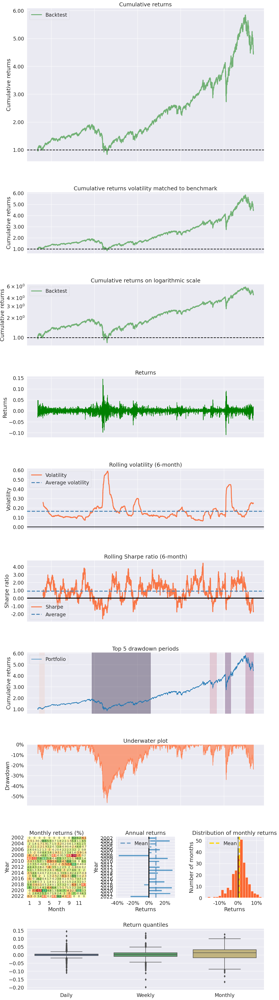

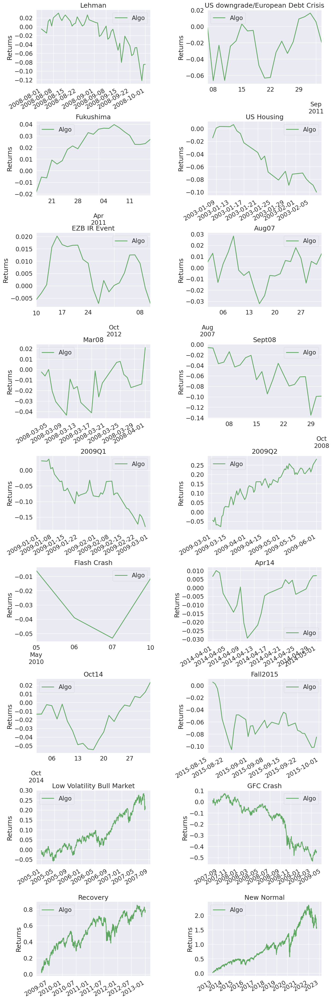

In [6]:
#Back testing and create a full tear sheet for S&P500 using Pyfolio
pf.create_full_tear_sheet(spy_rets)

In [7]:
#Create seperate data frame for NDAQ
ndaq = pd.DataFrame(new_data[1])
ndaq

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2002-09-30,3.100000,3.116667,3.100000,3.116667,2.621037,9300
2002-10-01,3.166667,3.166667,3.166667,3.166667,2.663086,6000
2002-10-02,3.166667,3.166667,3.100000,3.156667,2.654676,26100
2002-10-03,3.183333,3.183333,3.183333,3.183333,2.677101,300
2002-10-04,3.183333,3.183333,3.183333,3.183333,2.677101,1500
...,...,...,...,...,...,...
2022-09-23,57.099998,57.279999,56.200001,56.930000,56.930000,1920500
2022-09-26,56.900002,57.139999,56.290001,56.570000,56.570000,1772000
2022-09-27,57.009998,57.310001,56.369999,56.959999,56.959999,1697500


In [8]:
#Localize timezone to UTC
ndaq.index = ndaq.index.tz_localize('utc')

In [9]:
#Calculate Daily returns and drop any nulls
ndaq_rets = ndaq.Close.pct_change()
ndaq_rets = ndaq_rets.dropna()
ndaq_rets.head()

Date
2002-10-01 00:00:00+00:00    0.016043
2002-10-02 00:00:00+00:00   -0.003158
2002-10-03 00:00:00+00:00    0.008447
2002-10-04 00:00:00+00:00    0.000000
2002-10-07 00:00:00+00:00   -0.005235
Name: Close, dtype: float64

Start date,2002-10-01
End date,2022-09-29
Total months,239
,Backtest
Annual return,15.668%
Cumulative returns,1732.406%
Annual volatility,38.461%
Sharpe ratio,0.57
Calmar ratio,0.23
Stability,0.83
Max drawdown,-68.48%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,68.48,2007-12-26,2008-11-20,2015-02-19,1867
1,52.70,2002-12-12,2003-04-16,2004-01-12,283
2,51.28,2004-01-12,2004-09-17,2005-03-18,310
3,48.01,2006-01-30,2006-06-13,2007-11-02,460
4,38.60,2020-02-04,2020-03-23,2020-06-01,85


Stress Events,mean,min,max
Lehman,0.56%,-12.96%,17.47%
US downgrade/European Debt Crisis,0.15%,-10.49%,10.88%
Fukushima,0.42%,-5.15%,9.25%
US Housing,-0.46%,-8.09%,8.22%
EZB IR Event,-0.02%,-2.32%,2.23%
Aug07,0.29%,-4.77%,7.08%
Mar08,0.06%,-6.65%,9.51%
Sept08,0.22%,-12.96%,17.47%
2009Q1,-0.29%,-11.24%,12.61%
2009Q2,0.13%,-11.42%,14.01%


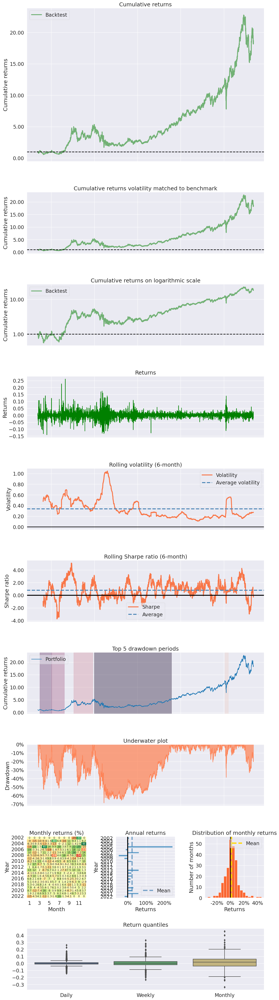

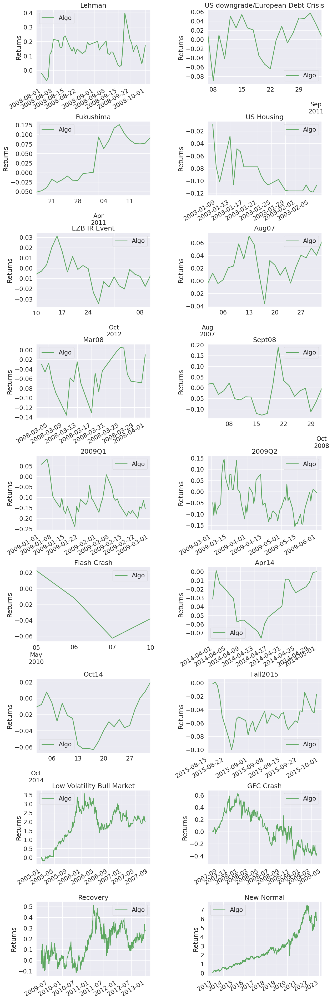

In [10]:
#Back testing and create a full tear sheet for NASDAQ using Pyfolio
pf.create_full_tear_sheet(ndaq_rets)

In [11]:
# 30 year US Treasury Bond yield  
bond = pd.DataFrame(new_data[2])
bond

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2002-09-30,4.666,4.668,4.618,4.662,4.662,0
2002-10-01,4.706,4.765,4.706,4.740,4.740,0
2002-10-02,4.733,4.761,4.707,4.726,4.726,0
2002-10-03,4.715,4.760,4.707,4.742,4.742,0
2002-10-04,4.729,4.816,4.699,4.734,4.734,0
...,...,...,...,...,...,...
2022-09-23,3.670,3.677,3.566,3.612,3.612,0
2022-09-26,3.672,3.729,3.612,3.698,3.698,0
2022-09-27,3.690,3.847,3.690,3.829,3.829,0


In [12]:
#Localize timezone to UTC
bond.index=bond.index.tz_localize('utc')

In [13]:
#Calculate Daily returns and drop any nulls
bond_rets = bond.Close.pct_change()
bond_rets = bond_rets.dropna()
bond_rets.head()

Date
2002-10-01 00:00:00+00:00    0.016731
2002-10-02 00:00:00+00:00   -0.002954
2002-10-03 00:00:00+00:00    0.003386
2002-10-04 00:00:00+00:00   -0.001687
2002-10-07 00:00:00+00:00   -0.004647
Name: Close, dtype: float64

Start date,2002-10-01
End date,2022-09-29
Total months,239
,Backtest
Annual return,-1.161%
Cumulative returns,-20.785%
Annual volatility,29.446%
Sharpe ratio,0.11
Calmar ratio,-0.01
Stability,0.74
Max drawdown,-83.141%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,83.14,2004-05-13,2020-03-09,NaT,NaN
1,19.36,2002-10-23,2003-06-13,2003-07-28,199
2,14.74,2003-08-13,2004-03-17,2004-05-07,193
3,3.36,2003-07-31,2003-08-07,2003-08-13,10
4,1.62,2002-10-03,2002-10-09,2002-10-11,7


Stress Events,mean,min,max
Lehman,-0.17%,-4.50%,6.15%
US downgrade/European Debt Crisis,-0.51%,-5.75%,7.04%
Fukushima,0.00%,-1.79%,1.64%
US Housing,-0.15%,-1.12%,2.84%
EZB IR Event,0.12%,-2.45%,4.08%
Aug07,-0.08%,-1.68%,2.45%
Mar08,-0.03%,-2.65%,3.53%
Sept08,-0.15%,-4.50%,6.15%
2009Q1,0.89%,-5.32%,7.99%
2009Q2,0.35%,-6.10%,5.46%


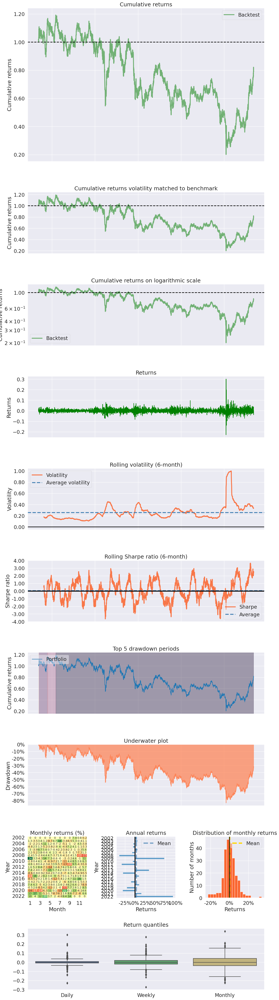

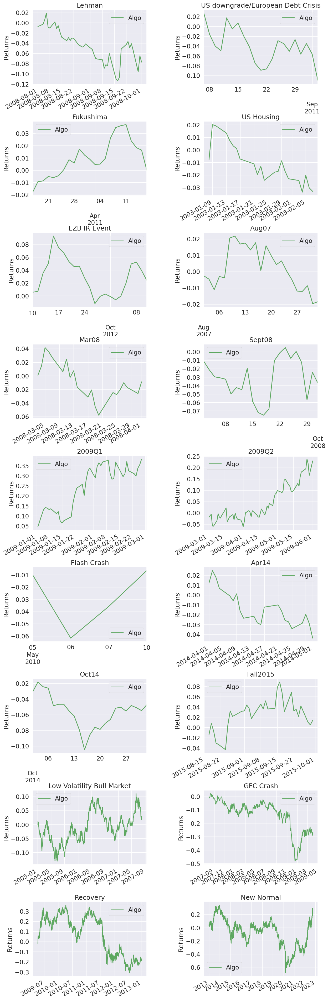

In [14]:
#Back testing and create a full tear sheet for US Treasury Bond yield using Pyfolio  
pf.create_full_tear_sheet(bond_rets)

In [15]:
# Join S&P500 returns, NASDQ100 returns and US Treasury Bond returns into a single Data frame with columns for each portfolios returns

combined_portfolio = pd.concat([spy_rets, ndaq_rets, bond_rets], axis="columns", join="inner")

# Display a few rows
combined_portfolio.head()

,Close,Close,Close
Date,,,
2002-10-01 00:00:00+00:00,0.048050,0.016043,0.016731
2002-10-02 00:00:00+00:00,-0.029981,-0.003158,-0.002954
2002-10-03 00:00:00+00:00,-0.010102,0.008447,0.003386
2002-10-04 00:00:00+00:00,-0.018345,0.000000,-0.001687
2002-10-07 00:00:00+00:00,-0.020668,-0.005235,-0.004647


In [16]:
# Drop nulls
combined_portfolio_rets = combined_portfolio.dropna()
combined_portfolio_rets.head()

,Close,Close,Close
Date,,,
2002-10-01 00:00:00+00:00,0.048050,0.016043,0.016731
2002-10-02 00:00:00+00:00,-0.029981,-0.003158,-0.002954
2002-10-03 00:00:00+00:00,-0.010102,0.008447,0.003386
2002-10-04 00:00:00+00:00,-0.018345,0.000000,-0.001687
2002-10-07 00:00:00+00:00,-0.020668,-0.005235,-0.004647


In [17]:
#Renamed columns 
combined_portfolio_rets.columns = ["S&P500", "NASDAQ", "BOND"]
combined_portfolio_rets.head()
combined_portfolio_rets.tail()

,S&P500,NASDAQ,BOND
Date,,,
2022-09-23 00:00:00+00:00,-0.016755,-0.008188,-0.007420
2022-09-26 00:00:00+00:00,-0.009893,-0.006324,0.023810
2022-09-27 00:00:00+00:00,-0.002553,0.006894,0.035425
2022-09-28 00:00:00+00:00,0.019676,0.023876,-0.038652
2022-09-29 00:00:00+00:00,-0.020889,-0.020748,0.003260


In [18]:
#Remove timestamp from date index
combined_portfolio_rets.index=combined_portfolio_rets.index.date
combined_portfolio_rets.head()

,S&P500,NASDAQ,BOND
2002-10-01,0.048050,0.016043,0.016731
2002-10-02,-0.029981,-0.003158,-0.002954
2002-10-03,-0.010102,0.008447,0.003386
2002-10-04,-0.018345,0.000000,-0.001687
2002-10-07,-0.020668,-0.005235,-0.004647


# Evaluate Riskiness of Stocks 


In [19]:
# Use the `std` function and multiply by the square root of the number of trading days in a year to get annualized volatility
volatility = combined_portfolio_rets.std() * np.sqrt(252)

# Sort values in ascending order
volatility = volatility.sort_values()

# Display the values
volatility

S&P500    0.192329
BOND      0.294460
NASDAQ    0.384732
dtype: float64

In [20]:
# Annualized Volatility
volatility.hvplot.bar(
    title="Annualized Historic Stock & Bond Volatilty",
    xlabel= "Stocks & Bonds",
    ylabel= "Volatility")

:Bars   [index]   (0)

In [21]:
#NASDAQ historic Daily Volatility
ndaq_rets.hvplot.scatter(
    title="NASDAQ Historic Daily Volatility",
    xlabel="Timeframe",
    ylabel="Volatility"
)

:Scatter   [Date]   (Close)

In [22]:
#S&P500 historic Daily Volatility
spy_rets.hvplot.scatter(
    title="S&P500 Historic Daily Volatility",
    xlabel="Timeframe",
    ylabel="Volatility"
)

:Scatter   [Date]   (Close)

In [23]:
#Bonds historic Daily Volatility
bond_rets.hvplot.scatter(
    title="Bonds Historic Daily Volatility",
    xlabel="Timeframe",
    ylabel="Volatility"
)

:Scatter   [Date]   (Close)

In [24]:
#Daily returns volatility in a scatter plot
combined_portfolio_rets.hvplot.scatter(
    title="Combined Data Historic Daily Volaitlity",
    xlabel="Timeframe",
    ylabel="Volatility"
)

:NdOverlay   [Variable]
   :Scatter   [index]   (value)

# Explain volatility 

From this data we are able to visualize the correlation between the S&P500 , NASDAQ and US Treasury Bond yield. For instance when we look at each stock against the impact of the 'GFC'(2008-2009) the bond was less volalitle than the S&P500 and the NASDAQ. The graphs also visualise a correlation between all three stocks and similar levels of volatility.

# Stock correlation of daily returns 

In [25]:
# Use the `corr` function to calculate correlations for each stock pair
correlation = combined_portfolio_rets.corr()
correlation

,S&P500,NASDAQ,BOND
S&P500,1.000000,0.563340,0.326923
NASDAQ,0.563340,1.000000,0.180146
BOND,0.326923,0.180146,1.000000


<AxesSubplot:>

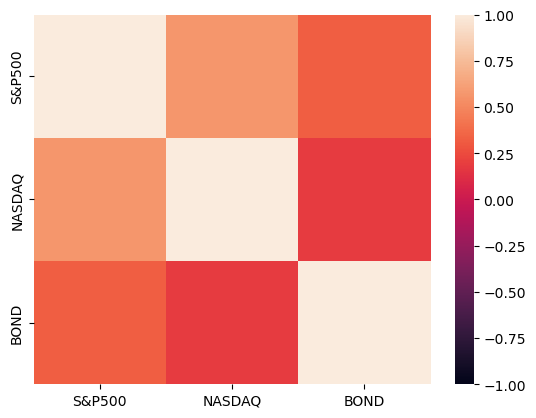

In [26]:
# Create a heatmap from the correlation values and adjust the scale
sns.heatmap(correlation, vmin=-1, vmax=1 )

# Explain correlation

There is a strong correlation between S&P and NASDAQ. There is lesser correlation between the S&P500 and the Bond, and there is a still a correlation between the NASDAQ and the bond although it is a weak correlation.

# Historic Portfolio returns

Set Portfolio Allocations/Weights and Calculate Portfolio Daily Returns
Set weights of existing portfolio

In [27]:
# Set weights for corresponding risk profile of stocks: SP500 and NSDAQ
weights = [0.50, 0.50, 0.00]

# Use the `dot` function to sum the product each weight and the corresponding stock daily return.
portfolio_returns = combined_portfolio_rets.dot(weights)

# Diplay sample values
portfolio_returns.head()

2002-10-01    0.032046
2002-10-02   -0.016570
2002-10-03   -0.000827
2002-10-04   -0.009173
2002-10-07   -0.012952
dtype: float64

 Calculate Cumulative Returns
 

In [28]:
# Use the `cumprod` function to calculate cumulative returns
cumulative_returns = (1 + portfolio_returns).cumprod()

# Display sample values
cumulative_returns.head()

2002-10-01    1.032046
2002-10-02    1.014946
2002-10-03    1.014106
2002-10-04    1.004804
2002-10-07    0.991790
dtype: float64

In [29]:
#Plot Historic Cumulative Returns of Current Portfolio
cumulative_returns.hvplot.line(
    title="Historic Cumulative Returns of Current Portfolio",
    xlabel="Timeframe",
    ylabel="Returns")

:Curve   [index]   (0)

## Forecast for Five Years Investment Plan


In [30]:
#Concaternate  all sourced data
data_df = pd.concat(new_data, axis=1, keys=["SPY", "NDAQ", "^TYX"])

In [31]:
#Clean data, check for nulls and drop them from the data frame.
data_df.isnull()
data_df.dropna()

SPY                                      \
                                 Open        High         Low       Close   
Date                                                                        
2002-09-30 00:00:00+00:00   82.000000   82.800003   80.900002   81.790001   
2002-10-01 00:00:00+00:00   82.430000   85.769997   81.470001   85.720001   
2002-10-02 00:00:00+00:00   84.690002   85.529999   82.599998   83.150002   
2002-10-03 00:00:00+00:00   83.139999   84.599998   81.949997   82.309998   
2002-10-04 00:00:00+00:00   82.800003   82.919998   79.580002   80.800003   
...                               ...         ...         ...         ...   
2022-09-23 00:00:00+00:00  370.579987  370.619995  363.290009  367.950012   
2022-09-26 00:00:00+00:00  366.410004  370.209991  363.029999  364.309998   
2022-09-27 00:00:00+00:00  368.019989  370.399994  360.869995  363.380005   
2022-09-28 00:00:00+00:00  364.380005  372.299988  362.600006  370.529999   
2022-09-29 00:00:00+00:00  366.809998  367.109985  359.700012  362.790009   

                                                       NDAQ             \
                            Adj Close     Volume       Open       High   
Date                                                                     
2002-09-30 00:00:00+00:00   55.707191   73096400   3.100000   3.116667   
2002-10-01 00:00:00+00:00   58.383884   67198100   3.166667   3.166667   
2002-10-02 00:00:00+00:00   56.633457   56749100   3.166667   3.166667   
2002-10-03 00:00:00+00:00   56.061356   55547000   3.183333   3.183333   
2002-10-04 00:00:00+00:00   55.032879   68483700   3.183333   3.183333   
...                               ...        ...        ...        ...   
2022-09-23 00:00:00+00:00  367.950012  122210100  57.099998  57.279999   
2022-09-26 00:00:00+00:00  364.309998   92581200  56.900002  57.139999   
2022-09-27 00:00:00+00:00  363.380005  108294100  57.009998  57.310001   
2022-09-28 00:00:00+00:00  370.529999  110802200  57.250000  58.590000   
2022-09-29 00:00:00+00:00  362.790009  112952300  57.959999  58.029999   

                                                                      ^TYX  \
                                 Low      Close  Adj Close   Volume   Open   
Date                                                                         
2002-09-30 00:00:00+00:00   3.100000   3.116667   2.621037     9300  4.666   
2002-10-01 00:00:00+00:00   3.166667   3.166667   2.663086     6000  4.706   
2002-10-02 00:00:00+00:00   3.100000   3.156667   2.654676    26100  4.733   
2002-10-03 00:00:00+00:00   3.183333   3.183333   2.677101      300  4.715   
2002-10-04 00:00:00+00:00   3.183333   3.183333   2.677101     1500  4.729   
...                              ...        ...        ...      ...    ...   
2022-09-23 00:00:00+00:00  56.200001  56.930000  56.930000  1920500  3.670   
2022-09-26 00:00:00+00:00  56.290001  56.570000  56.570000  1772000  3.672   
2022-09-27 00:00:00+00:00  56.369999  56.959999  56.959999  1697500  3.690   
2022-09-28 00:00:00+00:00  56.910000  58.320000  58.320000  2006400  3.838   
2022-09-29 00:00:00+00:00  56.790001  57.110001  57.110001  2177000  3.772   

                                                                 
                            High    Low  Close Adj Close Volume  
Date                                                             
2002-09-30 00:00:00+00:00  4.668  4.618  4.662     4.662    0.0  
2002-10-01 00:00:00+00:00  4.765  4.706  4.740     4.740    0.0  
2002-10-02 00:00:00+00:00  4.761  4.707  4.726     4.726    0.0  
2002-10-03 00:00:00+00:00  4.760  4.707  4.742     4.742    0.0  
2002-10-04 00:00:00+00:00  4.816  4.699  4.734     4.734    0.0  
...                          ...    ...    ...       ...    ...  
2022-09-23 00:00:00+00:00  3.677  3.566  3.612     3.612    0.0  
2022-09-26 00:00:00+00:00  3.729  3.612  3.698     3.698    0.0  
2022-09-27 00:00:00+00:00  3.847  3.690  3.829     3.829    0.0  
2022-09-28 00:00:00+00:00  3.841 

### Current Portfolio Forecasted Investment Plan

In [32]:
# Configure a Monte Carlo simulation to forecast five years cumulative returns
current_forecasted_returns = MCSimulation(
    portfolio_data = data_df,
    weights = [.50,.50,.0],
    num_simulation = 500,
    num_trading_days = 252*5
)

# Print the simulation input data
current_forecasted_returns.portfolio_data.head()

SPY                                   \
                                Open       High        Low      Close   
Date                                                                    
2002-09-30 00:00:00+00:00  82.000000  82.800003  80.900002  81.790001   
2002-10-01 00:00:00+00:00  82.430000  85.769997  81.470001  85.720001   
2002-10-02 00:00:00+00:00  84.690002  85.529999  82.599998  83.150002   
2002-10-03 00:00:00+00:00  83.139999  84.599998  81.949997  82.309998   
2002-10-04 00:00:00+00:00  82.800003  82.919998  79.580002  80.800003   

                                                                 NDAQ  \
                           Adj Close    Volume daily_return      Open   
Date                                                                    
2002-09-30 00:00:00+00:00  55.707191  73096400          NaN  3.100000   
2002-10-01 00:00:00+00:00  58.383884  67198100     0.048050  3.166667   
2002-10-02 00:00:00+00:00  56.633457  56749100    -0.029981  3.166667   
2002-10-03 00:00:00+00:00  56.061356  55547000    -0.010102  3.183333   
2002-10-04 00:00:00+00:00  55.032879  68483700    -0.018345  3.183333   

                                               ...                   \
                               High       Low  ... Adj Close Volume   
Date                                           ...                    
2002-09-30 00:00:00+00:00  3.116667  3.100000  ...  2.621037   9300   
2002-10-01 00:00:00+00:00  3.166667  3.166667  ...  2.663086   6000   
2002-10-02 00:00:00+00:00  3.166667  3.100000  ...  2.654676  26100   
2002-10-03 00:00:00+00:00  3.183333  3.183333  ...  2.677101    300   
2002-10-04 00:00:00+00:00  3.183333  3.183333  ...  2.677101   1500   

                                         ^TYX                                 \
                          daily_return   Open   High    Low  Close Adj Close   
Date                                                                           
2002-09-30 00:00:00+00:00          NaN  4.666  4.668  4.618  4.662     4.662   
2002-10-01 00:00:00+00:00     0.016043  4.706  4.765  4.706  4.740     4.740   
2002-10-02 00:00:00+00:00    -0.003158  4.733  4.761  4.707  4.726     4.726   
2002-10-03 00:00:00+00:00     0.008447  4.715  4.760  4.707  4.742     4.742   
2002-10-04 00:00:00+00:00     0.000000  4.729  4.816  4.699  4.734     4.734   

                                               
                          Volume daily_return  
Date                                           
2002-09-30 00:00:00+00:00    0.0          NaN  
2002-10-01 00:00:00+00:00    0.0     0.016731  
2002-10-02 00:00:00+00:00    0.0    -0.002954  
2002-10-03 00:00:00+00:00    0.0     0.003386  
2002-10-04 00:00:00+00:00    0.0    -0.001687  

[5 rows x 21 columns]

In [33]:
 # Run a Monte Carlo simulation to forecast five years cumulative returns
current_forecasted_returns_df = current_forecasted_returns.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

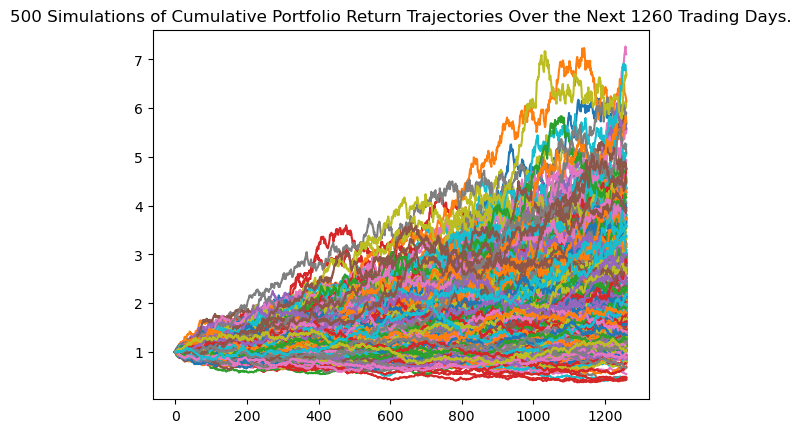

In [34]:
# Plot simulation outcomes
line_plot = current_forecasted_returns.plot_simulation()

<AxesSubplot:title={'center':'Average forecasted returns for current portfolio'}, xlabel='Trading Days', ylabel='Returns'>

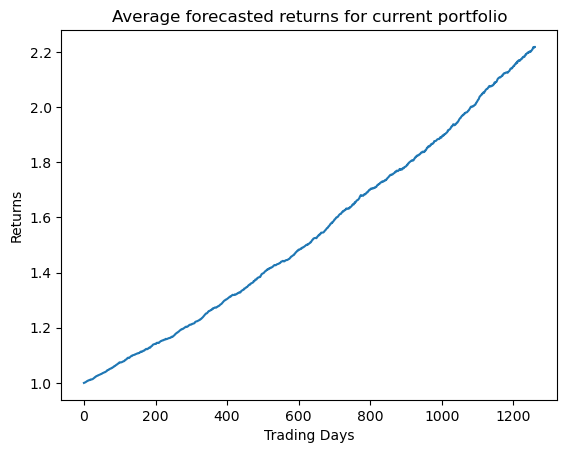

In [35]:
#Plot average returns for the current portfolio
current_forecasted_returns_df.mean(axis=1).plot(
    title="Average forecasted returns for current portfolio",
    xlabel= "Trading Days",
    ylabel= "Returns"
)

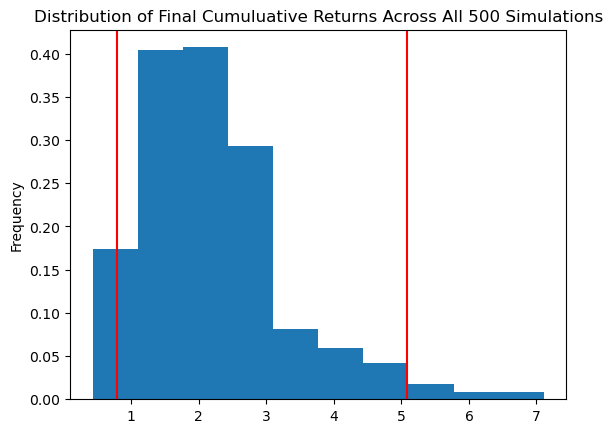

In [36]:
# Plot probability distribution and confidence intervals
portfolio_dist_plot = current_forecasted_returns.plot_distribution()

In [37]:
# Fetch summary statistics from the Monte Carlo simulation results
current_tbl = current_forecasted_returns.summarize_cumulative_return()
print(current_tbl)

count           500.000000
mean              2.218041
std               1.109361
min               0.430012
25%               1.391547
50%               2.048859
75%               2.743121
max               7.107616
95% CI Lower      0.787042
95% CI Upper      5.087562
Name: 1260, dtype: float64


In [38]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $100,000 investments in stocks
current_ci_lower = round(current_tbl[8]*100000,2)
current_ci_upper = round(current_tbl[9]*100000,2)

# Print results
print(f"There is a 95% chance that an initial investment of $100,000 in the current portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${current_ci_lower} and ${current_ci_upper}.")

There is a 95% chance that an initial investment of $100,000 in the current portfolio over the next 5 years will end within in the range of $78704.23 and $508756.24.


### S&P500 60% Forecasted Investment Plan

In [39]:
# Configure a Monte Carlo simulation to forecast five years cumulative returns with 60% S&P500 stock
MC_spy = MCSimulation(
    portfolio_data = data_df,
    weights = [.60,.40,.0],
    num_simulation = 500,
    num_trading_days = 252*5)

# Print the simulation input data
MC_spy.portfolio_data.head()

SPY                                   \
                                Open       High        Low      Close   
Date                                                                    
2002-09-30 00:00:00+00:00  82.000000  82.800003  80.900002  81.790001   
2002-10-01 00:00:00+00:00  82.430000  85.769997  81.470001  85.720001   
2002-10-02 00:00:00+00:00  84.690002  85.529999  82.599998  83.150002   
2002-10-03 00:00:00+00:00  83.139999  84.599998  81.949997  82.309998   
2002-10-04 00:00:00+00:00  82.800003  82.919998  79.580002  80.800003   

                                                                 NDAQ  \
                           Adj Close    Volume daily_return      Open   
Date                                                                    
2002-09-30 00:00:00+00:00  55.707191  73096400          NaN  3.100000   
2002-10-01 00:00:00+00:00  58.383884  67198100     0.048050  3.166667   
2002-10-02 00:00:00+00:00  56.633457  56749100    -0.029981  3.166667   
2002-10-03 00:00:00+00:00  56.061356  55547000    -0.010102  3.183333   
2002-10-04 00:00:00+00:00  55.032879  68483700    -0.018345  3.183333   

                                               ...                   \
                               High       Low  ... Adj Close Volume   
Date                                           ...                    
2002-09-30 00:00:00+00:00  3.116667  3.100000  ...  2.621037   9300   
2002-10-01 00:00:00+00:00  3.166667  3.166667  ...  2.663086   6000   
2002-10-02 00:00:00+00:00  3.166667  3.100000  ...  2.654676  26100   
2002-10-03 00:00:00+00:00  3.183333  3.183333  ...  2.677101    300   
2002-10-04 00:00:00+00:00  3.183333  3.183333  ...  2.677101   1500   

                                         ^TYX                                 \
                          daily_return   Open   High    Low  Close Adj Close   
Date                                                                           
2002-09-30 00:00:00+00:00          NaN  4.666  4.668  4.618  4.662     4.662   
2002-10-01 00:00:00+00:00     0.016043  4.706  4.765  4.706  4.740     4.740   
2002-10-02 00:00:00+00:00    -0.003158  4.733  4.761  4.707  4.726     4.726   
2002-10-03 00:00:00+00:00     0.008447  4.715  4.760  4.707  4.742     4.742   
2002-10-04 00:00:00+00:00     0.000000  4.729  4.816  4.699  4.734     4.734   

                                               
                          Volume daily_return  
Date                                           
2002-09-30 00:00:00+00:00    0.0          NaN  
2002-10-01 00:00:00+00:00    0.0     0.016731  
2002-10-02 00:00:00+00:00    0.0    -0.002954  
2002-10-03 00:00:00+00:00    0.0     0.003386  
2002-10-04 00:00:00+00:00    0.0    -0.001687  

[5 rows x 21 columns]

In [40]:
# Run a Monte Carlo simulation to forecast five years cumulative returns with 60% S&P500 stock
spy_weighted_returns_df = MC_spy.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

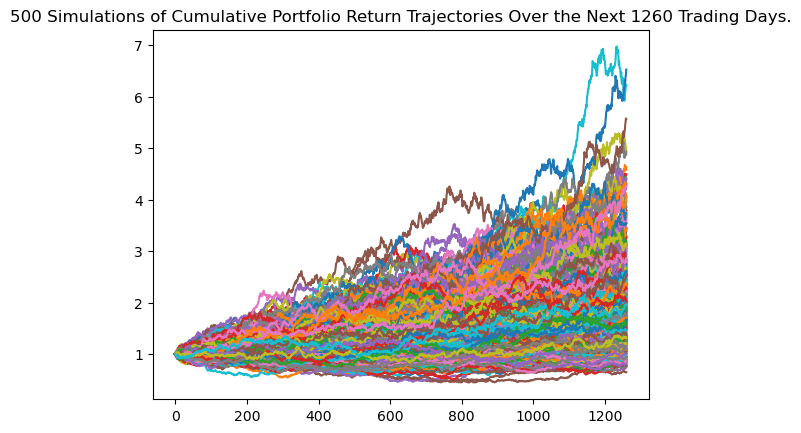

In [41]:
# Plot simulation outcomes
spy_line_plot = MC_spy.plot_simulation()

In [42]:
#Calculate the 'mean' of each simulation
spy_weighted_returns_df.mean(axis=1)

0       1.000000
1       1.000374
2       1.000952
3       1.001751
4       1.002011
          ...   
1256    2.010959
1257    2.010296
1258    2.013875
1259    2.014925
1260    2.017729
Length: 1261, dtype: float64

<AxesSubplot:title={'center':'Average forecasted returns for 60% S&P500 portfolio'}, xlabel='Trading Days', ylabel='Returns'>

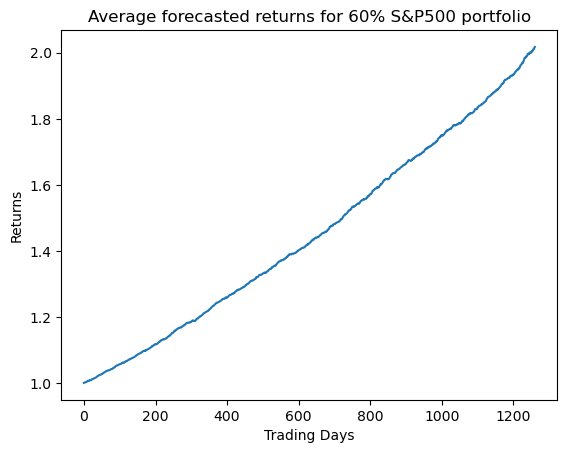

In [43]:
#Plot average returns for 60% S&P500 portfolio
spy_weighted_returns_df.mean(axis=1).plot(
   title="Average forecasted returns for 60% S&P500 portfolio",
    xlabel= "Trading Days",
    ylabel= "Returns"
)

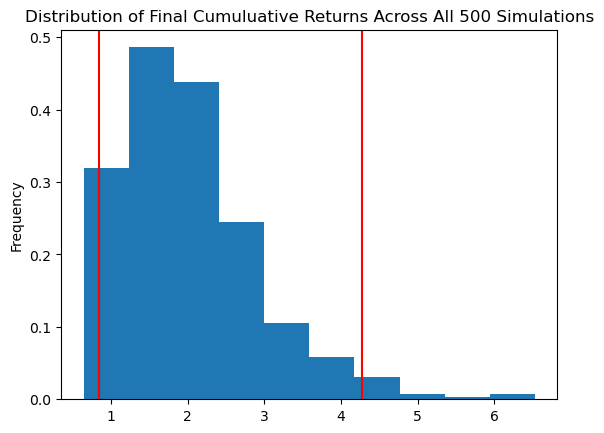

In [44]:
# Plot probability distribution and confidence intervals
spy_portfolio_dist_plot = MC_spy.plot_distribution()

In [45]:
# Fetch summary statistics from the Monte Carlo simulation results
spy_tbl = MC_spy.summarize_cumulative_return()
print(spy_tbl)

count           500.000000
mean              2.017729
std               0.881909
min               0.645869
25%               1.360250
50%               1.893307
75%               2.468187
max               6.527820
95% CI Lower      0.845205
95% CI Upper      4.270297
Name: 1260, dtype: float64


In [46]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $100,000 investments in stocks
spy_ci_lower = round(spy_tbl[8]*100000,2)
spy_ci_upper = round(spy_tbl[9]*100000,2)

# Print results
print(f"There is a 95% chance that an initial investment of $100,000 in the 60% S&P500 portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${spy_ci_lower} and ${spy_ci_upper}.")

There is a 95% chance that an initial investment of $100,000 in the 60% S&P500 portfolio over the next 5 years will end within in the range of $84520.53 and $427029.7.


### NASDAQ 60% Forecasted Investment Plan

In [47]:
# Configure a Monte Carlo simulation to forecast five years cumulative returns with 60% NASDAQ stock
MC_ndaq = MCSimulation(
    portfolio_data = data_df,
    weights = [.40,.60,.0],
    num_simulation = 500,
    num_trading_days = 252*5)

# Print the simulation input data
MC_ndaq.portfolio_data.head()

SPY                                   \
                                Open       High        Low      Close   
Date                                                                    
2002-09-30 00:00:00+00:00  82.000000  82.800003  80.900002  81.790001   
2002-10-01 00:00:00+00:00  82.430000  85.769997  81.470001  85.720001   
2002-10-02 00:00:00+00:00  84.690002  85.529999  82.599998  83.150002   
2002-10-03 00:00:00+00:00  83.139999  84.599998  81.949997  82.309998   
2002-10-04 00:00:00+00:00  82.800003  82.919998  79.580002  80.800003   

                                                                 NDAQ  \
                           Adj Close    Volume daily_return      Open   
Date                                                                    
2002-09-30 00:00:00+00:00  55.707191  73096400          NaN  3.100000   
2002-10-01 00:00:00+00:00  58.383884  67198100     0.048050  3.166667   
2002-10-02 00:00:00+00:00  56.633457  56749100    -0.029981  3.166667   
2002-10-03 00:00:00+00:00  56.061356  55547000    -0.010102  3.183333   
2002-10-04 00:00:00+00:00  55.032879  68483700    -0.018345  3.183333   

                                               ...                   \
                               High       Low  ... Adj Close Volume   
Date                                           ...                    
2002-09-30 00:00:00+00:00  3.116667  3.100000  ...  2.621037   9300   
2002-10-01 00:00:00+00:00  3.166667  3.166667  ...  2.663086   6000   
2002-10-02 00:00:00+00:00  3.166667  3.100000  ...  2.654676  26100   
2002-10-03 00:00:00+00:00  3.183333  3.183333  ...  2.677101    300   
2002-10-04 00:00:00+00:00  3.183333  3.183333  ...  2.677101   1500   

                                         ^TYX                                 \
                          daily_return   Open   High    Low  Close Adj Close   
Date                                                                           
2002-09-30 00:00:00+00:00          NaN  4.666  4.668  4.618  4.662     4.662   
2002-10-01 00:00:00+00:00     0.016043  4.706  4.765  4.706  4.740     4.740   
2002-10-02 00:00:00+00:00    -0.003158  4.733  4.761  4.707  4.726     4.726   
2002-10-03 00:00:00+00:00     0.008447  4.715  4.760  4.707  4.742     4.742   
2002-10-04 00:00:00+00:00     0.000000  4.729  4.816  4.699  4.734     4.734   

                                               
                          Volume daily_return  
Date                                           
2002-09-30 00:00:00+00:00    0.0          NaN  
2002-10-01 00:00:00+00:00    0.0     0.016731  
2002-10-02 00:00:00+00:00    0.0    -0.002954  
2002-10-03 00:00:00+00:00    0.0     0.003386  
2002-10-04 00:00:00+00:00    0.0    -0.001687  

[5 rows x 21 columns]

In [48]:
# Run a Monte Carlo simulation to forecast five years cumulative returns with 60% NASDAQ stock
ndaq_weighted_returns_df = MC_ndaq.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

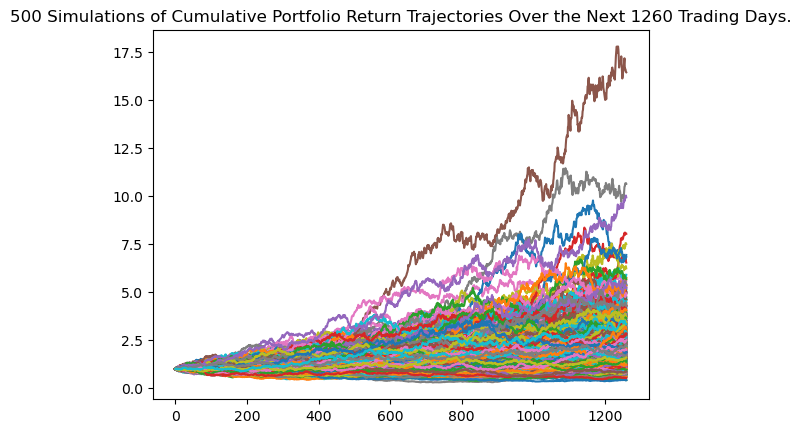

In [49]:
# Plot simulation outcomes
ndaq_line_plot = MC_ndaq.plot_simulation()

In [50]:
#Calculate the 'mean' of each simulation
ndaq_weighted_returns_df.mean(axis=1)

0       1.000000
1       1.000894
2       1.002177
3       1.002511
4       1.003100
          ...   
1256    2.337428
1257    2.338493
1258    2.339098
1259    2.338302
1260    2.339105
Length: 1261, dtype: float64

<AxesSubplot:title={'center':'Average forecasted returns for 60% NASDQ portfolio'}, xlabel='Trading Days', ylabel='Returns'>

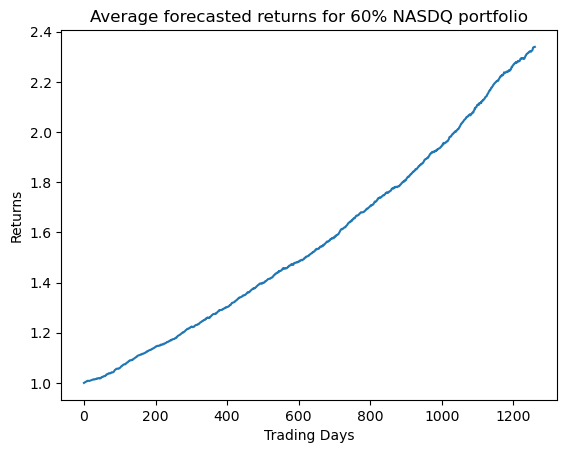

In [51]:
#Plot average returns for 60% NASDQ portfolio
ndaq_weighted_returns_df.mean(axis=1).plot(
    title="Average forecasted returns for 60% NASDQ portfolio",
    xlabel= "Trading Days",
    ylabel= "Returns"
)


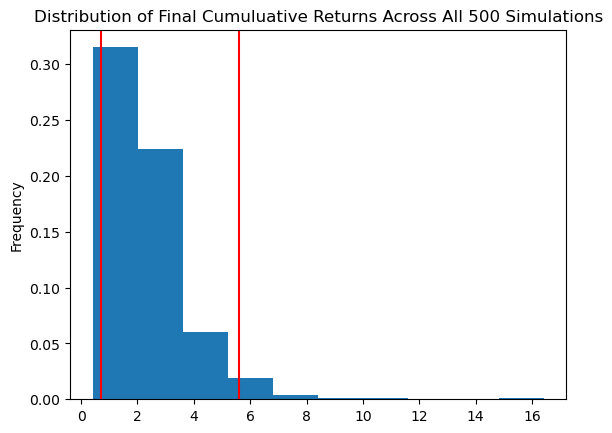

In [52]:
# Plot probability distribution and confidence intervals
ndaq_portfolio_dist_plot = MC_ndaq.plot_distribution()

In [53]:
# Fetch summary statistics from the Monte Carlo simulation results
ndaq_tbl = MC_ndaq.summarize_cumulative_return()
print(ndaq_tbl)

count           500.000000
mean              2.339105
std               1.471333
min               0.415616
25%               1.422801
50%               2.010920
75%               2.846547
max              16.420028
95% CI Lower      0.700640
95% CI Upper      5.617496
Name: 1260, dtype: float64


In [54]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $100,000 investments in stocks
ndaq_ci_lower = round(ndaq_tbl[8]*100000,2)
ndaq_ci_upper = round(ndaq_tbl[9]*100000,2)

# Print results
print(f"There is a 95% chance that an initial investment of $100,000 in the 60% NASDAQ portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ndaq_ci_lower} and ${ndaq_ci_upper}.")

There is a 95% chance that an initial investment of $100,000 in the 60% NASDAQ portfolio over the next 5 years will end within in the range of $70064.02 and $561749.56.


### S&P500 70% Forecasted Investment Plan

In [55]:
# Configure a Monte Carlo simulation to forecast five years cumulative returns with 70% S&P500 stock
MC_hv_spy = MCSimulation(
    portfolio_data = data_df,
    weights = [.70,.30,.0],
    num_simulation = 500,
    num_trading_days = 252*5)

# Print the simulation input data
MC_hv_spy.portfolio_data.head()

SPY                                   \
                                Open       High        Low      Close   
Date                                                                    
2002-09-30 00:00:00+00:00  82.000000  82.800003  80.900002  81.790001   
2002-10-01 00:00:00+00:00  82.430000  85.769997  81.470001  85.720001   
2002-10-02 00:00:00+00:00  84.690002  85.529999  82.599998  83.150002   
2002-10-03 00:00:00+00:00  83.139999  84.599998  81.949997  82.309998   
2002-10-04 00:00:00+00:00  82.800003  82.919998  79.580002  80.800003   

                                                                 NDAQ  \
                           Adj Close    Volume daily_return      Open   
Date                                                                    
2002-09-30 00:00:00+00:00  55.707191  73096400          NaN  3.100000   
2002-10-01 00:00:00+00:00  58.383884  67198100     0.048050  3.166667   
2002-10-02 00:00:00+00:00  56.633457  56749100    -0.029981  3.166667   
2002-10-03 00:00:00+00:00  56.061356  55547000    -0.010102  3.183333   
2002-10-04 00:00:00+00:00  55.032879  68483700    -0.018345  3.183333   

                                               ...                   \
                               High       Low  ... Adj Close Volume   
Date                                           ...                    
2002-09-30 00:00:00+00:00  3.116667  3.100000  ...  2.621037   9300   
2002-10-01 00:00:00+00:00  3.166667  3.166667  ...  2.663086   6000   
2002-10-02 00:00:00+00:00  3.166667  3.100000  ...  2.654676  26100   
2002-10-03 00:00:00+00:00  3.183333  3.183333  ...  2.677101    300   
2002-10-04 00:00:00+00:00  3.183333  3.183333  ...  2.677101   1500   

                                         ^TYX                                 \
                          daily_return   Open   High    Low  Close Adj Close   
Date                                                                           
2002-09-30 00:00:00+00:00          NaN  4.666  4.668  4.618  4.662     4.662   
2002-10-01 00:00:00+00:00     0.016043  4.706  4.765  4.706  4.740     4.740   
2002-10-02 00:00:00+00:00    -0.003158  4.733  4.761  4.707  4.726     4.726   
2002-10-03 00:00:00+00:00     0.008447  4.715  4.760  4.707  4.742     4.742   
2002-10-04 00:00:00+00:00     0.000000  4.729  4.816  4.699  4.734     4.734   

                                               
                          Volume daily_return  
Date                                           
2002-09-30 00:00:00+00:00    0.0          NaN  
2002-10-01 00:00:00+00:00    0.0     0.016731  
2002-10-02 00:00:00+00:00    0.0    -0.002954  
2002-10-03 00:00:00+00:00    0.0     0.003386  
2002-10-04 00:00:00+00:00    0.0    -0.001687  

[5 rows x 21 columns]

In [56]:
# Run a Monte Carlo simulation to forecast five years cumulative returns with 70% S&P500 stock
spy_hv_weighted_returns_df = MC_hv_spy.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

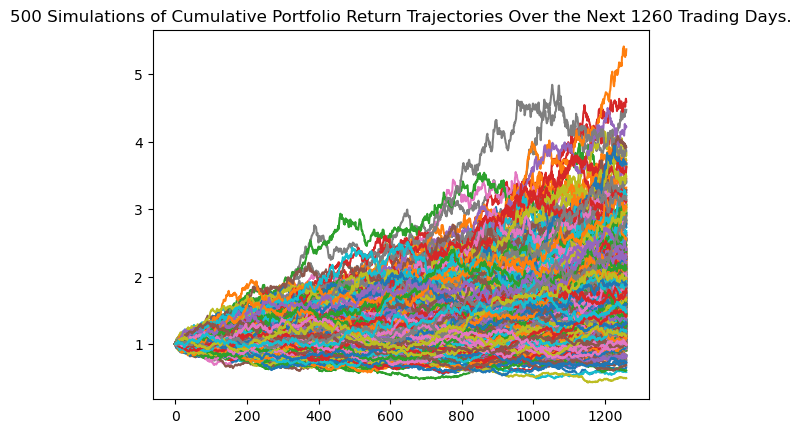

In [57]:
# Plot simulation outcomes
spy_hv_line_plot = MC_hv_spy.plot_simulation()

In [58]:
#Calculate the 'mean' of each simulation
spy_hv_weighted_returns_df.mean(axis=1)

0       1.000000
1       1.001200
2       1.000566
3       1.000944
4       1.001802
          ...   
1256    1.836790
1257    1.837537
1258    1.838476
1259    1.839789
1260    1.840505
Length: 1261, dtype: float64

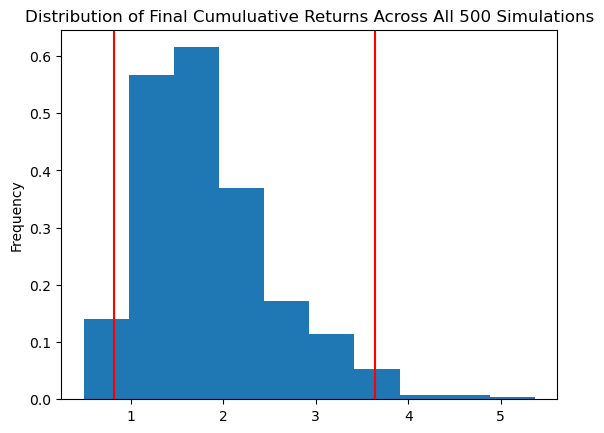

In [59]:
# Plot probability distribution and confidence intervals
spy_hv_portfolio_dist_plot = MC_hv_spy.plot_distribution()

In [60]:
# Fetch summary statistics from the Monte Carlo simulation results
spy_hv_tbl = MC_hv_spy.summarize_cumulative_return()
print(ndaq_tbl)

count           500.000000
mean              2.339105
std               1.471333
min               0.415616
25%               1.422801
50%               2.010920
75%               2.846547
max              16.420028
95% CI Lower      0.700640
95% CI Upper      5.617496
Name: 1260, dtype: float64


<AxesSubplot:title={'center':'Average forecasted returns for Heavy Weighted SPY portfolio'}, xlabel='Trading Days', ylabel='Returns'>

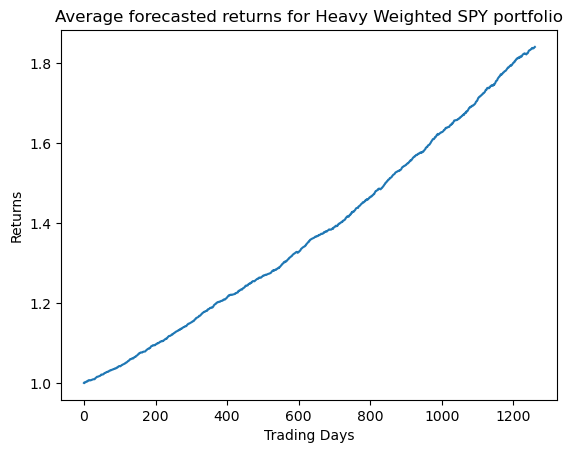

In [61]:
#Plot average returns for Heavy Weighted SPY portfolio
spy_hv_weighted_returns_df.mean(axis=1).plot(
    title="Average forecasted returns for Heavy Weighted SPY portfolio",
    xlabel= "Trading Days",
    ylabel= "Returns"
)

In [62]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $100,000 investments in stocks
spy_hv_ci_lower = round(spy_hv_tbl[8]*100000,2)
spy_hv_ci_upper = round(spy_hv_tbl[9]*100000,2)

# Print results
print(f"There is a 95% chance that an initial investment of $100,000 in the Heavy Weighted SPY portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${spy_hv_ci_lower} and ${spy_hv_ci_upper}.")

There is a 95% chance that an initial investment of $100,000 in the Heavy Weighted SPY portfolio over the next 5 years will end within in the range of $82059.77 and $364230.91.


### NASDAQ 70% Forecasted Investment Plan

In [63]:
# Configure a Monte Carlo simulation to forecast five years cumulative returns with 70% NASDAQ stock
MC_hv_ndaq = MCSimulation(
    portfolio_data = data_df,
    weights = [.30,.70,.0],
    num_simulation = 500,
    num_trading_days = 252*5)

# Print the simulation input data
MC_hv_ndaq.portfolio_data.head()

SPY                                   \
                                Open       High        Low      Close   
Date                                                                    
2002-09-30 00:00:00+00:00  82.000000  82.800003  80.900002  81.790001   
2002-10-01 00:00:00+00:00  82.430000  85.769997  81.470001  85.720001   
2002-10-02 00:00:00+00:00  84.690002  85.529999  82.599998  83.150002   
2002-10-03 00:00:00+00:00  83.139999  84.599998  81.949997  82.309998   
2002-10-04 00:00:00+00:00  82.800003  82.919998  79.580002  80.800003   

                                                                 NDAQ  \
                           Adj Close    Volume daily_return      Open   
Date                                                                    
2002-09-30 00:00:00+00:00  55.707191  73096400          NaN  3.100000   
2002-10-01 00:00:00+00:00  58.383884  67198100     0.048050  3.166667   
2002-10-02 00:00:00+00:00  56.633457  56749100    -0.029981  3.166667   
2002-10-03 00:00:00+00:00  56.061356  55547000    -0.010102  3.183333   
2002-10-04 00:00:00+00:00  55.032879  68483700    -0.018345  3.183333   

                                               ...                   \
                               High       Low  ... Adj Close Volume   
Date                                           ...                    
2002-09-30 00:00:00+00:00  3.116667  3.100000  ...  2.621037   9300   
2002-10-01 00:00:00+00:00  3.166667  3.166667  ...  2.663086   6000   
2002-10-02 00:00:00+00:00  3.166667  3.100000  ...  2.654676  26100   
2002-10-03 00:00:00+00:00  3.183333  3.183333  ...  2.677101    300   
2002-10-04 00:00:00+00:00  3.183333  3.183333  ...  2.677101   1500   

                                         ^TYX                                 \
                          daily_return   Open   High    Low  Close Adj Close   
Date                                                                           
2002-09-30 00:00:00+00:00          NaN  4.666  4.668  4.618  4.662     4.662   
2002-10-01 00:00:00+00:00     0.016043  4.706  4.765  4.706  4.740     4.740   
2002-10-02 00:00:00+00:00    -0.003158  4.733  4.761  4.707  4.726     4.726   
2002-10-03 00:00:00+00:00     0.008447  4.715  4.760  4.707  4.742     4.742   
2002-10-04 00:00:00+00:00     0.000000  4.729  4.816  4.699  4.734     4.734   

                                               
                          Volume daily_return  
Date                                           
2002-09-30 00:00:00+00:00    0.0          NaN  
2002-10-01 00:00:00+00:00    0.0     0.016731  
2002-10-02 00:00:00+00:00    0.0    -0.002954  
2002-10-03 00:00:00+00:00    0.0     0.003386  
2002-10-04 00:00:00+00:00    0.0    -0.001687  

[5 rows x 21 columns]

In [64]:
# Run a Monte Carlo simulation to forecast five years cumulative returns with 70% NASDAQ stock
ndaq_hv_weighted_returns_df = MC_hv_ndaq.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

In [65]:
#Summary of Monte Carlo simulation to forecast five years cumulative returns with 70% NASDAQ stock
ndaq_hv_weighted_returns_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
count,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,...,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000,1261.000000
mean,0.895674,1.087587,0.819249,2.103552,5.703530,1.096065,1.151584,1.862644,1.822650,1.348189,...,0.903498,1.450815,2.061969,0.932211,1.328504,5.369440,1.093854,1.204424,0.711894,1.197183
std,0.270129,0.277942,0.165069,0.690962,3.452561,0.138492,0.246825,0.548853,0.233088,0.265440,...,0.167625,0.385805,1.265428,0.229774,0.371299,2.523816,0.181378,0.368868,0.119062,0.451506
min,0.441992,0.658785,0.473934,0.887266,0.995915,0.800918,0.813404,0.990148,0.991794,0.866865,...,0.615436,0.848147,0.714210,0.508743,0.744621,0.992046,0.717908,0.738410,0.502429,0.694511
25%,0.658394,0.907275,0.683050,1.590770,2.408811,0.992365,0.980513,1.416993,1.694277,1.168707,...,0.792313,1.085036,1.046502,0.743866,1.013366,3.051611,0.952799,0.931506,0.609897,0.863186
50%,0.992061,1.020778,0.800528,2.079854,4.579408,1.078362,1.099231,1.665007,1.806702,1.271643,...,0.868471,1.415432,1.423819,0.903765,1.305879,5.677748,1.085189,1.100820,0.692260,0.973944
75%,1.104468,1.159761,0.949823,2.585641,9.246026,1.205733,1.227026,2.364388,1.928860,1.474503,...,0.991424,1.774755,3.327567,1.110037,1.545984,7.199696,1.232751,1.308049,0.801032,1.582834
max,1.380533,2.136771,1.247744,3.807785,12.266242,1.473624,2.088577,3.011838,2.740447,2.067943,...,1.373137,2.370644,5.165095,1.398364,2.183845,9.955416,1.562027,2.177357,1.029716,2.612068


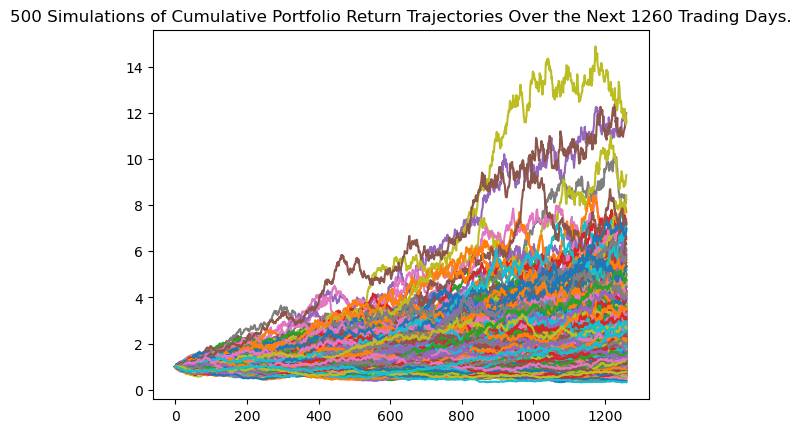

In [66]:
# Plot simulation outcomes
ndaq_hv_line_plot = MC_hv_ndaq.plot_simulation()

In [67]:
#Calculate the 'mean' of each simulation
ndaq_hv_weighted_returns_df.mean(axis=1)

0       1.000000
1       1.001792
2       1.003238
3       1.003767
4       1.003842
          ...   
1256    2.516923
1257    2.521552
1258    2.524439
1259    2.521934
1260    2.521698
Length: 1261, dtype: float64

<AxesSubplot:title={'center':'Average forecasted returns for Heavy Weighted NDAQ portfolio'}, xlabel='Trading Days', ylabel='Returns'>

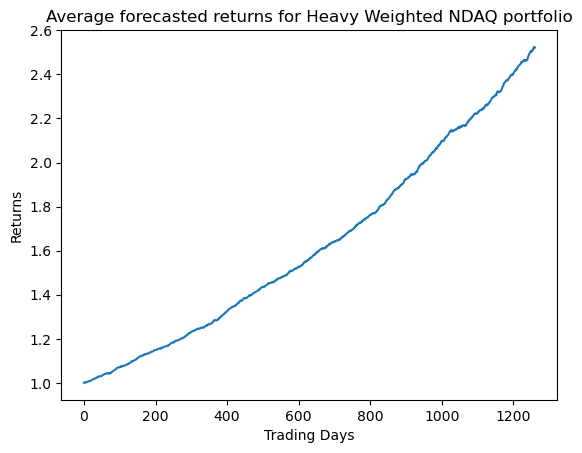

In [68]:
#Plot average returns for Heavy Weighted NDAQ portfolio
ndaq_hv_weighted_returns_df.mean(axis=1).plot(
    title="Average forecasted returns for Heavy Weighted NDAQ portfolio",
    xlabel= "Trading Days",
    ylabel= "Returns"
)

In [69]:
# Fetch summary statistics from the Monte Carlo simulation results
ndaq_hv_tbl = MC_hv_ndaq.summarize_cumulative_return()
print(ndaq_tbl)

count           500.000000
mean              2.339105
std               1.471333
min               0.415616
25%               1.422801
50%               2.010920
75%               2.846547
max              16.420028
95% CI Lower      0.700640
95% CI Upper      5.617496
Name: 1260, dtype: float64


In [70]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $100,000 investments in stocks
ndaq_hv_ci_lower = round(ndaq_hv_tbl[8]*100000,2)
ndaq_hv_ci_upper = round(ndaq_hv_tbl[9]*100000,2)

# Print results
print(f"There is a 95% chance that an initial investment of $100,000 in the heavy weighted NDAQ portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ndaq_hv_ci_lower} and ${ndaq_hv_ci_upper}.")

There is a 95% chance that an initial investment of $100,000 in the heavy weighted NDAQ portfolio over the next 5 years will end within in the range of $58810.17 and $698589.23.


In [71]:
#Calculate the average return for all portfolios
current_portfolio = current_forecasted_returns_df.mean(axis=1)
spy_portfolio = spy_weighted_returns_df.mean(axis=1)
ndaq_portfolio = ndaq_weighted_returns_df.mean(axis=1)
hv_spy_portfolio = spy_hv_weighted_returns_df.mean(axis=1)
hv_ndaq_porfolio = ndaq_hv_weighted_returns_df.mean(axis=1)
print(current_portfolio, spy_portfolio, ndaq_portfolio, hv_spy_portfolio, hv_ndaq_porfolio)

0       1.000000
1       1.000718
2       1.001037
3       1.001797
4       1.002120
          ...   
1256    2.217734
1257    2.214842
1258    2.216425
1259    2.218110
1260    2.218041
Length: 1261, dtype: float64 0       1.000000
1       1.000374
2       1.000952
3       1.001751
4       1.002011
          ...   
1256    2.010959
1257    2.010296
1258    2.013875
1259    2.014925
1260    2.017729
Length: 1261, dtype: float64 0       1.000000
1       1.000894
2       1.002177
3       1.002511
4       1.003100
          ...   
1256    2.337428
1257    2.338493
1258    2.339098
1259    2.338302
1260    2.339105
Length: 1261, dtype: float64 0       1.000000
1       1.001200
2       1.000566
3       1.000944
4       1.001802
          ...   
1256    1.836790
1257    1.837537
1258    1.838476
1259    1.839789
1260    1.840505
Length: 1261, dtype: float64 0       1.000000
1       1.001792
2       1.003238
3       1.003767
4       1.003842
          ...   
1256    2.516923
1257    2.521552


In [72]:
#Combine Portfolio Average Returns
combined_df = pd.concat((current_portfolio, spy_portfolio, ndaq_portfolio, hv_spy_portfolio, hv_ndaq_porfolio), axis=1, keys=["Current Portfolio", "SPY Portfolio", "NDAQ Portfolio", "Heavy Weighted SPY Portfolio", "Heavy Weighted NDAQ Portfolio"])
combined_df

,Current Portfolio,SPY Portfolio,NDAQ Portfolio,Heavy Weighted SPY Portfolio,Heavy Weighted NDAQ Portfolio
0,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.000718,1.000374,1.000894,1.001200,1.001792
2,1.001037,1.000952,1.002177,1.000566,1.003238
3,1.001797,1.001751,1.002511,1.000944,1.003767
4,1.002120,1.002011,1.003100,1.001802,1.003842
...,...,...,...,...,...
1256,2.217734,2.010959,2.337428,1.836790,2.516923
1257,2.214842,2.010296,2.338493,1.837537,2.521552
1258,2.216425,2.013875,2.339098,1.838476,2.524439
1259,2.218110,2.014925,2.338302,1.839789,2.521934


In [73]:
#Plot all portfolio's average return
potfolios_overview = combined_df/combined_df.iloc[0]
potfolios_overview.hvplot(
    xlabel="Tradings Days", 
    ylabel="Average Return('mean')",
    title= "Simulated Portfolio's Average forecasted Return Overview",
    width=1000, height=400,
)

:NdOverlay   [Variable]
   :Curve   [index]   (value)

# Recommendations

In [74]:
#Recommendation for greatest returns
upside_recommendations = ([ndaq_hv_ci_upper, ndaq_ci_upper, spy_ci_upper, spy_hv_ci_upper, current_ci_upper])
print(f"After evaluating the five forecasted portfolios, Current Portfolio, SPY Portfolio, NDAQ Portfolio, Heavy Weighted, SPY Portfolio and Heavy Weighted NDAQ Portfolio we have to the following conclusion.")


if ndaq_hv_ci_upper > ndaq_ci_upper and   ndaq_hv_ci_upper >  spy_ci_upper and ndaq_hv_ci_upper > spy_hv_ci_upper and ndaq_hv_ci_upper > current_ci_upper :
    print(f"The Heavy weight NASDAQ Portfolio has the greatest return potential of ${ndaq_hv_ci_upper}")
elif spy_hv_ci_upper > ndaq_ci_upper and   spy_hv_ci_upper >  spy_ci_upper and spy_hv_ci_upper > ndaq_hv_ci_upper and spy_hv_ci_upper > current_ci_upper:
    print(f"The Heavy weight SPY Portfolio has the greatest return potential of ${spy_hv_ci_upper}")

elif spy_ci_upper > ndaq_ci_upper and   spy_ci_upper >  spy_hv_ci_upper and spy_ci_upper > ndaq_hv_ci_upper and spy_ci_upper > current_ci_upper:
    print(f"The Heavy weight SPY Portfolio has the greatest return potential of${spy_ci_upper}")

elif ndaq_ci_upper > spy_ci_upper and   ndaq_ci_upper >  spy_hv_ci_upper and ndaq_ci_upper > ndaq_hv_ci_upper and ndaq_ci_upper > current_ci_upper:
    print(f"The Heavy weight SPY Portfolio has the greatest return potential of ${ndaq_ci_upper}")

elif current_ci_upper > spy_ci_upper and   current_ci_upper >  spy_hv_ci_upper and current_ci_upper > ndaq_hv_ci_upper and current_ci_upper > ndaq_ci_upper:
    print(f"The Heavy weight SPY Portfolio has the greatest return potential of${current_ci_upper}")

else:
    print(f"No certain result")

After evaluating the five forecasted portfolios, Current Portfolio, SPY Portfolio, NDAQ Portfolio, Heavy Weighted, SPY Portfolio and Heavy Weighted NDAQ Portfolio we have to the following conclusion.
The Heavy weight NASDAQ Portfolio has the greatest return potential of $698589.23


In [75]:
#Recommendation for least downside
least_downside_recommendations = ([ndaq_hv_ci_lower, ndaq_ci_lower, spy_ci_lower, spy_hv_ci_upper, current_ci_lower ])
print(f"After evaluating the five forecasted portfolio, Current Portfolio, SPY Portfolio, NDAQ Portfolio, Heavy Weighted, SPY Portfolio and Heavy Weighted NDAQ Portfolio we have to the following conclusion.")

if ndaq_hv_ci_lower > ndaq_ci_lower and    ndaq_hv_ci_lower >  spy_ci_lower and ndaq_hv_ci_lower > spy_hv_ci_lower and ndaq_hv_ci_lower > current_ci_lower :
    print(f"The Heavy weight NASDAQ Portfolio has the least downside return potential with ${ndaq_hv_ci_upper}")

elif spy_hv_ci_lower > ndaq_ci_lower and    spy_hv_ci_lower >  spy_ci_lower and spy_hv_ci_lower > ndaq_hv_ci_lower and spy_hv_ci_lower > current_ci_lower:
    print(f"The Heavy weight SPY Portfolio has the least downside return potential with ${spy_hv_ci_lower}")

elif spy_ci_lower > ndaq_ci_lower and    spy_ci_lower >  spy_hv_ci_lower and spy_ci_lower > ndaq_hv_ci_lower and spy_ci_lower > current_ci_lower:
    print(f"The Heavy weight SPY Portfolio has the least downside return potential with ${spy_ci_lower}")

elif ndaq_ci_lower > spy_ci_lower and    ndaq_ci_lower >  spy_hv_ci_lower and ndaq_ci_lower > ndaq_hv_ci_lower and ndaq_ci_lower > current_ci_lower:
    print(f"The Heavy weight SPY Portfolio has the least downside return potential with ${ndaq_ci_lower}")

elif current_ci_lower > spy_ci_lower and    current_ci_lower >  spy_hv_ci_lower and current_ci_lower > ndaq_hv_ci_lower and current_ci_lower > ndaq_ci_lower:
    print(f"The Heavy weight SPY Portfolio has the least downside return potential with ${ndaq_ci_lower}")

else:
    print(f"No certain result")

After evaluating the five forecasted portfolio, Current Portfolio, SPY Portfolio, NDAQ Portfolio, Heavy Weighted, SPY Portfolio and Heavy Weighted NDAQ Portfolio we have to the following conclusion.
The Heavy weight SPY Portfolio has the least downside return potential with $84520.53
